In [1]:
import sys
import os
import time
import glob
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.compose import TransformedTargetRegressor
from sklearn.svm import SVR

sys.path.append(os.path.abspath('..'))
import src.utils.garmin_utils as garmin_utils
import src.utils.matfcns as matfcns

In [2]:
def get_error_df(y_pred_train, y_train, y_pred, y_test, estim_name):
    mse = [mean_squared_error(y_pred_train, y_train), mean_squared_error(y_pred, y_test)]
    mae = [mean_absolute_error(y_pred_train, y_train), mean_absolute_error(y_pred, y_test)]
    results = pd.DataFrame({'dataset': [f'{estim_name}_train', f'{estim_name}_test'], 'MAE':mae, 'MSE': mse})
    results = results.set_index('dataset')
    return results

def plot_actual_vs_predicted_timeseries(y_pred, y_test, timestamp, title):
    data = [
        go.Scatter(x =timestamp, y=y_test, name='actual'),
        go.Scatter(x =timestamp, y=y_pred, name='predicted')
    ]
    fig = go.Figure(data=data)
    fig.update_layout(
        title=title,
        yaxis_title='power (watts)',
    )
    fig.show()

def plot_actual_vs_predicted_scatter(y_pred, y_test, title, xy_title=['actual', 'predicted']):
    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel(xy_title[0])
    plt.ylabel(xy_title[1])
    plt.title(title)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2)
    plt.show()



In this notebook we attempt to remedy the two prediction errors we've identified at the end of the [previous notebook](part1_model_evaluation.ipynb). 

# Contents
1. Remedy the underestimation of peaks
   
   1.1 Theory

   1.2 Low-pass filtering with different window sizes
2. Identification of the source of the systematic error
   
   2.1 Prediction of `power` with windy regions removed
   
   2.2 Prediction of `power` with constant prevalent wind


# 1. Remedy underestimation of peaks
We need theory in order to tackle this problem.

## 1.1 Theory

Power is work done in unit time, and work is force times displacement $s$. Hence we may express power $P$ as
$$P = \frac{W}{t} = F\cdot \frac{s}{t} = F\cdot v$$

Thus in order to compute $P$, we need to know all the forces involved. There are three: gravity force, air drag force, and rolling resistance force.

### Gravity
Gravity force $F_g$ is expressed as 
$$ F_g = m g \sin(\theta) $$

where $m$ is mass, $g\ (=9.8067 m/s)$ is the gravity constant, and $\theta$ is the slope of the terrain.

### Rolling resistance
[Rolling resistance force]() $F_{rr}$
$$F_{rr} = C_{rr} m g \cos(\theta) $$
where $C_{rr}$ is a dimensionless constant.

### Aerodynamic drag
[Aerodynamic drag force]() due to wind is
$$F_d = \frac{1}{2} \rho v_{as}^2 C_{d} A$$
where $C_d$ is a dimensionless constant, $\rho$ density of air, $A$ the cross-sectional area of the biker, and $v_{as}$ is air speed. 

It is important that we distinguish air speed $v_{as}$ from ground speed $v_{gs}$ ($\equiv$ `enhanced_speed`). 
Note that speed is the magnitude of velocity, so
$v_{as}$ is the magnitude of the vector sum 
$$\vec{v}_{as} = -\vec{v}_{gs} + \vec{v}_{hw}$$ 
where $\vec{v}_{hw}$ is the head wind *velocity*.


So far we've assumed that $\vec{v}_{hw}=0$, so that effectively $v_{as}$ has been equal to $v_{gs}$.

Note that our data set contains `grade` instead of $\theta$. With $\phi$ denoting `grade`, the relationship between the two is
$$\phi = 100 \tan(\theta) = 100\ \frac{\textrm{rise}}{\textrm{run}}$$

### Energy conservation

Due to conservation of energy $P$ can now be expressed as
$$\begin{align}
P & = \big[ F_g + F_{rr} + F_d\big] \cdot {v_{gs}} \\
  & =  \big[ m g \sin(\theta) + C_{rr} m g \cos(\theta) + \frac{1}{2} \rho v_{as}^2 C_{d} A \big] \cdot v_{gs}
\end{align}
$$
Hence, if we assume *constant* head wind, we obtain
$$\begin{equation}\tag{3}P = a\cdot v_{gs}^3 + b\cdot v_{gs}^2 + f(\phi) \cdot v_{gs} + d\end{equation}$$
for some constants $a,\ b,\ d$, and some function $f(\cdot)$.


If we assume head wind to be non-constant, we have
$$P = a\cdot v_{gs}^3 + b\cdot v_{hw}^2\cdot v_{gs} + c\cdot v_{gs}\cdot \langle\vec{v}_{gs},\ \vec{v}_{hw}\rangle + f(\phi) \cdot v_{gs} + d$$
where $\langle\cdot, \cdot\rangle$ denotes the inner product. This easily becomes intractable, so we stick to the constant head wind assumption.


## 1.2 (Accuracy) vs. (time resolution) trade-off
As noted in the [EDA notebook](eda.ipynb), recreational cyclists' `power` bursts are in the 800-1200 watts range.
We also know that the power sensor is real-time.
However the other features, most notably `heart-rate`, are averaged values. It is impossible in the information science sense that we can recreate the real-time peaks from the averaged valued features.
Hence we need to average all the variables.

The longer the averaging period, the shorter the sharp peaks. However we lose timeliness from averaging.
We'd like to identify a good balance - shorten the peaks so as to make the problem solvable while not making the averaging period too long.

We first take a quick look at the distribution of the target variable, and recall that all of the models we considered in the previous notebook did not fare well when `power` > 400.

In [3]:
datadir = '../data/garmin/processed'
processed_file = datadir + '/eda__raw_all.csv' # the result of cleaning raw data
df = pd.read_csv(processed_file)
df['timestamp'] = pd.to_datetime(df['timestamp'])
df.set_index(df['timestamp'], inplace=True)

days = [12, 23, 25, 26, 15]

mask_train = (df['timestamp'].dt.day == days[0]) | (df['timestamp'].dt.day == days[2]) | (df['timestamp'].dt.day == days[3]) | (df['timestamp'].dt.day == days[4])
mask_test  = (df['timestamp'].dt.day == 23) 

timestamp_train = df.loc[mask_train, 'timestamp']
timestamp_test = df.loc[mask_test, 'timestamp']

X = df.drop(['power', 'timestamp', 'position_lat', 'position_long', 'y_pred_linreg', 'distance', 'd_distance', 'enhanced_altitude'], axis=1)

X_train = X[mask_train]
y_train = df.loc[mask_train, 'power']
X_test  = X[mask_test]
y_test  = df.loc[mask_test, 'power']


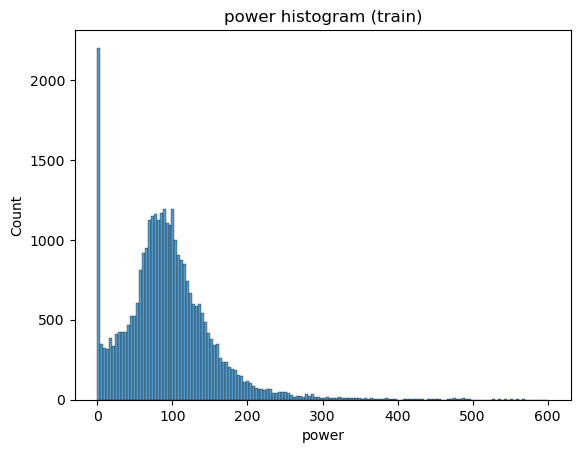

count    33341.000000
mean        93.880276
std         61.709922
min          0.000000
25%         58.454545
50%         88.636364
75%        122.181818
max        600.636364
Name: power, dtype: float64

In [4]:
sns.histplot(y_train)
plt.title('power histogram (train)')
plt.show()

y_train.describe().transpose()

For convience I've computed moving averages with different window sizes and saved them with names eda__raw_all_winsize_\<X\>, where X is the window size in seconds. 
This was done offline .The script ../src/prepare_data.py can be used to generate the files.

Below we compute the relevant powers, look at MAE of `power` vs. theoretical_power, and examine the max power against window size.

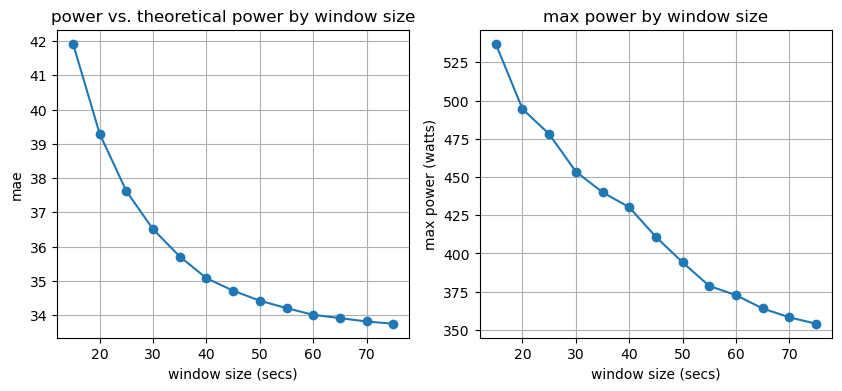

In [5]:
mass = 90 # weight of rider + bike in kg
windows = np.arange(15, 80, 5)
mae = []
perc = np.zeros((len(windows), 2)) # to hold the 90th and 100th percentiles

for i, k in enumerate(windows):
    fullpath = f'{datadir}/eda__raw_all_winsize_{k}.csv'
    dataset = pd.read_csv(fullpath)
    dataset = dataset.dropna() # nan is due to moving average
    perc[i, :] = np.percentile(dataset['power'], [90, 100])

    v_gs = dataset['enhanced_speed']
    v_hw = 0
    v_as = v_gs + v_hw
    rho = matfcns.temperature2density(dataset['temperature'])
    drag_force = matfcns.dragF(v_as, rho, area=0.5089, Cd=0.63)
    gravity_force = matfcns.gravityF(dataset['grade'], mass)
    roll_force = matfcns.roll_resistF(dataset['grade'], mass, Crr=0.005)

    dataset['gravity_power'] = gravity_force * v_gs
    dataset['roll_power'] = roll_force * v_gs
    dataset['drag_power'] = drag_force * v_as

    mae.append(mean_absolute_error(dataset['power'], dataset['gravity_power']+dataset['roll_power']+dataset['drag_power']))


fig, axs = plt.subplots(1, 2, figsize=(10, 4))
axs[0].plot(windows, mae, marker='o')
axs[0].set(xlabel='window size (secs)', ylabel='mae')
axs[0].grid()
axs[0].title.set_text('power vs. theoretical power by window size') 

axs[1].plot(windows, perc[:, 1], marker='o')
axs[1].set(xlabel='window size (secs)', ylabel='max power (watts)')
axs[1].grid()
axs[1].title.set_text('max power by window size')
plt.show()

Inspecting the plots above we choose to average over 50 seconds. 50 seconds is the minimum time window where max power approximates 400.

# 2. Identification of the source of the systematic error

$P$ must equal $\big[ F_g + F_{rr} + F_d\big] \cdot {v_{gs}}$. We examine locations where this equality is violated. 

We use a single day's ride (8/26) to simplify plots. We need to redo train-test split because the underlying data has changed.

In [6]:
processed_file = '../data/garmin/processed/eda__raw_all_winsize_50.csv' # moving average over 50 seconds
df = pd.read_csv(processed_file)
df['timestamp'] = pd.to_datetime(df['timestamp'])
df.set_index(df['timestamp'], inplace=True)
df = df.dropna() # these are introduced by movmean()
df = df[~np.isinf(df['grade'])] # grade can be infty

mask_train = (df['timestamp'].dt.day == days[0]) | (df['timestamp'].dt.day == days[2]) | (df['timestamp'].dt.day == days[3]) | (df['timestamp'].dt.day == days[4])
mask_test  = (df['timestamp'].dt.day == 23) 

timestamp_train = df.loc[mask_train, 'timestamp']
timestamp_test = df.loc[mask_test, 'timestamp']

X = df.drop(['power', 'timestamp', 'position_lat', 'position_long', 'distance', 'd_distance', 'enhanced_altitude'], axis=1)

X_train = X[mask_train]
y_train = df.loc[mask_train, 'power']
X_test  = X[mask_test]
y_test  = df.loc[mask_test, 'power']

In [7]:
def compute_powers(mass, grade, temperature, v_gs, v_hw, Cd=0.63, area=0.5089, Crr=0.005):
    v_as = np.add(v_gs, v_hw)
    rho = matfcns.temperature2density(temperature)

    gravity_force = matfcns.gravityF(grade, mass)
    roll_force = matfcns.roll_resistF(grade, mass, Crr)
    drag_force = matfcns.dragF(v_as, rho, area, Cd)

    d_p = drag_force * v_as
    g_p = gravity_force * v_gs
    r_p = roll_force * v_gs

    return g_p, r_p, d_p

In [8]:
dayidx = 3
df26 = df.loc[df['timestamp'].dt.day == days[dayidx]]
v_hw = 0 # still assuming no head wind
g_p, r_p, d_p = compute_powers(mass, df26['grade'], df26['temperature'], df26['enhanced_speed'], v_hw)

dts = np.array([
    datetime(2023, 8, 26, 10, 17, 0),  datetime(2023, 8, 26, 10, 50, 0),
    datetime(2023, 8, 26, 16, 37, 30), datetime(2023, 8, 26, 16, 56, 0)
])

The two intervals between the black and fuchsia vertical lines stand out as having large differences.

In [9]:
data = [
    go.Scatter(x=df26['timestamp'], y=df26['power'], name='power'),
    go.Scatter(x=df26['timestamp'], y=g_p+r_p+d_p, name='gravity+roll+drag')
]
fig = go.Figure(data=data)

fig.add_vline(x=dts[0], line_color='black')
fig.add_vline(x=dts[1], line_color='black')
fig.add_vline(x=dts[2], line_color='fuchsia')
fig.add_vline(x=dts[3], line_color='fuchsia')

fig.update_layout(
    title='power vs. gravity+roll+drag power',
    yaxis_title='power (watts)',
)
fig.show()


We inspect the geographical map corresponding to the 2 intervals.

In [10]:
mask_dt1 = (df['timestamp'] >= dts[0]) & (df['timestamp'] <= dts[1])
mask_dt2 = (df['timestamp'] >= dts[2]) & (df['timestamp'] <= dts[3])

data = [
    go.Scattermapbox(
        lat=df26['position_lat'],
        lon=df26['position_long'],
        mode='markers',
        marker=go.scattermapbox.Marker(color='blue', size=2),
        name='entire route'
    ),
    go.Scattermapbox(
        lat=df26.loc[mask_dt1, 'position_lat'],
        lon=df26.loc[mask_dt1, 'position_long'],
        mode='markers',
        marker=go.scattermapbox.Marker(color='black'),
        name='interval 1'
    ),
    go.Scattermapbox(
        lat=df26.loc[mask_dt2, 'position_lat'],
        lon=df26.loc[mask_dt2, 'position_long'],
        mode='markers',
        marker=go.scattermapbox.Marker(color='fuchsia'),
        name='interval 2'
    )

]
fig = go.Figure(data=data)

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r":0,"t":0,"l":0,"b":0},
    mapbox=dict(zoom=9.5,
                center=dict(lat=37.48, lon=-122.04)
                ),
    width=800, height=600
)
fig.show()



The boundaries of the intervals above weren't chosen carefully. We' simply eyeballed regions where the measured `power` and the theoretical power diverge and stumbled upon this discovery: the *regions where the two diverge is where the biker had siginificant wind exposure*. This is because we know that wind is strong where buildings are absent - buildings shield bikers from the wind within cities.

In the remaining sections we attempt to validate this finding.

## 2.1 Prediction of `power` with windy regions removed

We want to show that estimators fail when the absolute difference between power and theoretical power is large.
We'll demonstrate this by training a linear regressor (with polynomial features) on subsets that include increasingly larger absolute differences between power and theoretical power,
and show that test scores increase along larger subsets.

None of the estimators we considered in part1 fared well in predicting power over 400, which was why we applied low-pass filters (moving average) in the previous section.
Even after applying the filter estimators underestimate sharp peaks.
Thus we'll have to control for this factor when making the comparison.

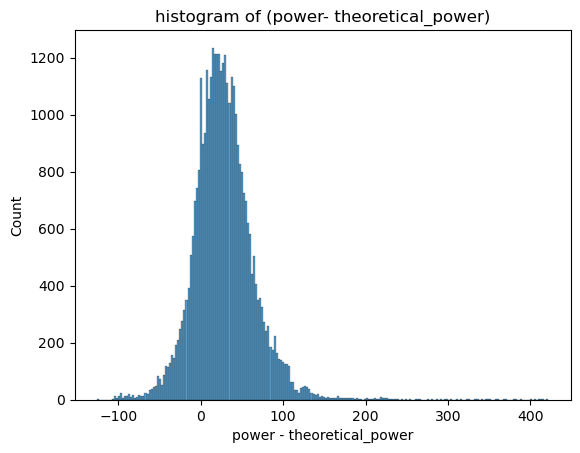

In [11]:
v_hw = 0 # 0 head wind
g_p, r_p, d_p = compute_powers(mass, X_train['grade'], X_train['temperature'], X_train['enhanced_speed'], v_hw)
theoretical_power_train = g_p + r_p + d_p
g_p, r_p, d_p = compute_powers(mass, X_test['grade'], X_test['temperature'], X_test['enhanced_speed'], v_hw)
theoretical_power_test = g_p + r_p + d_p

power_diff = y_train.values - theoretical_power_train
power_diff_test = y_test.values - theoretical_power_test


sns.histplot(power_diff)
plt.xlabel('power - theoretical_power')
plt.title('histogram of (power- theoretical_power)')
plt.show()


In [12]:
keep_cols_base = [
    'enhanced_speed',
    'd_enhanced_speed',
    'cadence',
    'd_cadence',
    'heart_rate',
    'grade',
    # 'd_enhanced_altitude',
    'temperature'
]

select_cols = [
    'enhanced_speed',
    'enhanced_speed^2',
    'enhanced_speed^3',
    'enhanced_speed grade',
    # 'd_enhanced_speed',
    # 'd_enhanced_altitude',
    'grade',
    'cadence',
    'd_cadence',
    'heart_rate',
    'temperature'
]

pf = PolynomialFeatures(degree=3, include_bias=False)
X_pf_train = pd.DataFrame(pf.fit_transform(X_train[keep_cols_base]), columns=pf.get_feature_names_out()).set_index(timestamp_train)
X_pf_test = pd.DataFrame(pf.fit_transform(X_test[keep_cols_base]), columns=pf.get_feature_names_out()).set_index(timestamp_test)
feature_names = pf.get_feature_names_out()

pipe_linreg = Pipeline([
    ('scaler', StandardScaler()),
    ('linreg', LinearRegression())
])

We first train against the entire train set to determine the maximum predicted `power`.

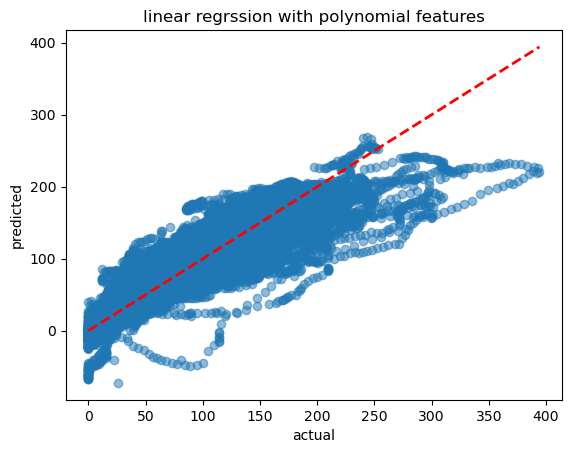

In [13]:
pipe_linreg.fit(X_pf_train[select_cols], y_train)
y_pred_train = pipe_linreg.predict(X_pf_train[select_cols])
plot_actual_vs_predicted_scatter(y_pred_train, y_train, 'linear regrssion with polynomial features')

We see that this estimator doesn't make predictions above 300 watts.

Below we train this estimator on increasing subsets of the data, controlling for the loss incurred by not being able to predict over 300.

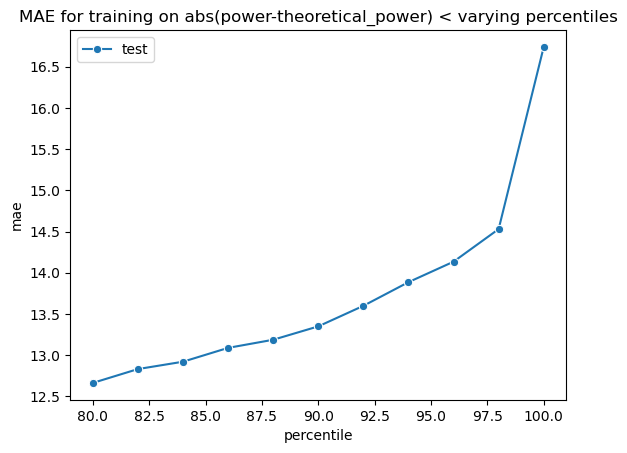

In [14]:
perc = np.arange(80, 101, 2) # 80, 82, .., 100 percentiles
perc_val = np.percentile(abs(power_diff), perc)
max_pred = 300

mae_train, mae_test, means = [], [], []

for i, k in enumerate(perc):
    mask_train = np.logical_and(np.abs(power_diff) < perc_val[i], y_train < max_pred)
    mask_test = np.logical_and(np.abs(power_diff_test) < perc_val[i], y_test < max_pred)

    pipe_linreg.fit(X_pf_train.loc[mask_train, select_cols], y_train[mask_train])

    y_pred_train = pipe_linreg.predict(X_pf_train.loc[mask_train, select_cols])
    y_pred = pipe_linreg.predict(X_pf_test.loc[mask_test, select_cols])
    
    mae_train.append(mean_absolute_error(y_pred_train, y_train[mask_train]))
    mae_test.append(mean_absolute_error(y_pred, y_test[mask_test]))
    means.append(np.mean(y_test[mask_test]))


sns.lineplot(x=perc, y=mae_test, marker='o', label='test')
plt.ylabel('mae')
plt.xlabel('percentile')
plt.title('MAE for training on abs(power-theoretical_power) < varying percentiles')
plt.show()

As conjectured, the larger the abs(power - theoretical_power), the larger the MAE. 
This implies there is a fundamental limitation. No model will perform very well since we are lacking the feature (wind) for prediction.

In the next section we take a different tack - if we had wind data, would it really reduce prediction errors?

## 2.2 Prediction of `power` with constant prevelant wind

We develop a simplistic model of wind, and examine if it reduces the gap between the measured `power` and the theoretical power.
To this end we create a dataframe consisting solely of the first windy section we identified earlier.

The model is truly simplistic - it assumes constant 8mph wind from the NNW direction. This was the recorded prevalent wind on the day of the ride.

We also assume that the (long, lat) coordinates behave as perfect cartesian (x, y) coordinates.

In [15]:
windy_df = df.loc[np.logical_and(df['timestamp'] >= dts[0], df['timestamp'] <= dts[1])].copy()

v_hw = 0 # the case when we assume there is no head wind
windy_df['g_p'], windy_df['r_p'], windy_df['d_p'] = compute_powers(mass, windy_df['grade'], windy_df['temperature'], windy_df['enhanced_speed'], v_hw)


In [16]:

wind_speed_mph = 8
mph2mps = 1/2.23694
ang = np.pi*13/8 # radian angle for NNW wind
vec_v_hw = np.array([np.cos(ang), np.sin(ang)]) * wind_speed_mph * mph2mps

vec_v_gs = windy_df[['position_long', 'position_lat']].diff() # ground speed velocity
vec_v_gs_norm = np.linalg.norm(vec_v_gs, axis=1)
vec_v_gs = windy_df['enhanced_speed'].values.reshape(-1, 1) * (vec_v_gs/vec_v_gs_norm.reshape(-1, 1))

vec_v_as = -vec_v_gs + vec_v_hw # air velocity
inner = np.sum(vec_v_as * vec_v_gs, axis=1) # angle between the air and the ground velocity

vec_v_as_norm = np.linalg.norm(vec_v_as, axis=1) # air speed

rho = matfcns.temperature2density(windy_df['temperature'])
windy_df['v_as'] = vec_v_as_norm
windy_df['d_p_computed'] = matfcns.dragF(windy_df['v_as'], rho) * windy_df['enhanced_speed']
windy_df[['enhanced_speed', 'v_as', 'g_p', 'r_p', 'd_p', 'd_p_computed']].sample(5)

,enhanced_speed,v_as,g_p,r_p,d_p,d_p_computed
timestamp,,,,,,
2023-08-26 10:34:23,3.145118,3.792887,13.808511,13.879280,5.994773,8.718441
2023-08-26 10:41:08,5.239529,8.795019,-3.453253,23.122115,27.670870,77.967180
2023-08-26 10:23:23,4.197137,7.770464,6.875597,18.521998,14.312150,49.056036
2023-08-26 10:28:13,4.126314,6.884500,6.891646,18.209452,13.561018,37.749618
2023-08-26 10:42:10,5.739784,9.302818,0.000000,25.329754,36.387091,95.583999


We plot a few $\vec{v}_{as}$ vectors to verify if we've computed them correctly. 
The line depicts the traveled path.
They roughly point to the east because the rider is traveling to the north direction ($\vec{v}_{gs}$ points to north), and
$\vec{v}_{as} = -\vec{v}_{gs} + \vec{v}_{hw}$.

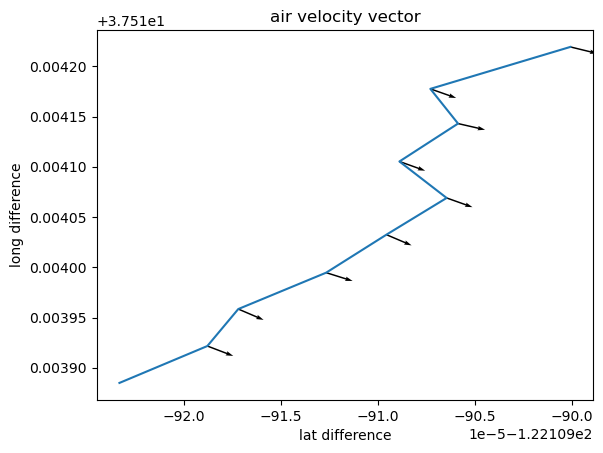

In [17]:
rng = np.arange(1, 11) # choose to show 10 vectors

plt.plot(windy_df.iloc[rng, 2], windy_df.iloc[rng, 1]) # (long, lat)
plt.quiver(windy_df.iloc[rng, 2], windy_df.iloc[rng, 1], vec_v_as.values[:len(rng),0], vec_v_as.values[:len(rng),1], angles='xy', width=0.003)
plt.xlabel('lat difference')
plt.ylabel('long difference')
plt.title('air velocity vector')
plt.show()

In [18]:
data = [
    go.Scatter(x=windy_df['timestamp'], y=windy_df['power'], name='power'),
    go.Scatter(x=windy_df['timestamp'], y=windy_df['g_p']+windy_df['r_p']+windy_df['d_p'], name='gravity+roll+(drag from 0 wind)'),
    go.Scatter(x=windy_df['timestamp'], y=windy_df['g_p']+windy_df['r_p']+windy_df['d_p_computed'], name='gravity+roll+(drag from computed wind)')
]
fig = go.Figure(data=data)
fig.update_layout(
    title='comparison of measured power, theoretical power with 0 wind, and theoretical power with 8mph NNW wind',
    yaxis_title='power (watts)',
)
fig.show()


In [19]:
mae = [
    mean_absolute_error(windy_df['power'], np.sum(windy_df[['g_p', 'r_p', 'd_p']], axis=1)),
    mean_absolute_error(windy_df['power'], np.sum(windy_df[['g_p', 'r_p', 'd_p_computed']], axis=1)),
]

error_df = pd.DataFrame({'dataset': ['0mph wind', '8mph NNW wind'], 'mae': mae})
error_df


,dataset,mae
0,0mph wind,38.880601
1,8mph NNW wind,17.694122


Results above show that, even with the simplistic model assuming constant prevalent wind, we are able to cut MAE by more than half in a 'windy' section of the data.
This should be considered evidence that wind is a major missing feature.

